In [1]:
!pip install numpy pandas matplotlib seaborn scikit-learn tensorflow opencv-python pillow

C:\Users\DELL\AppData\Roaming\Python\Python310\site-packages\seaborn\categorical.py:3399: UserWarning: 22.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\DELL\AppData\Roaming\Python\Python310\site-packages\seaborn\categorical.py:3399: UserWarning: 25.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


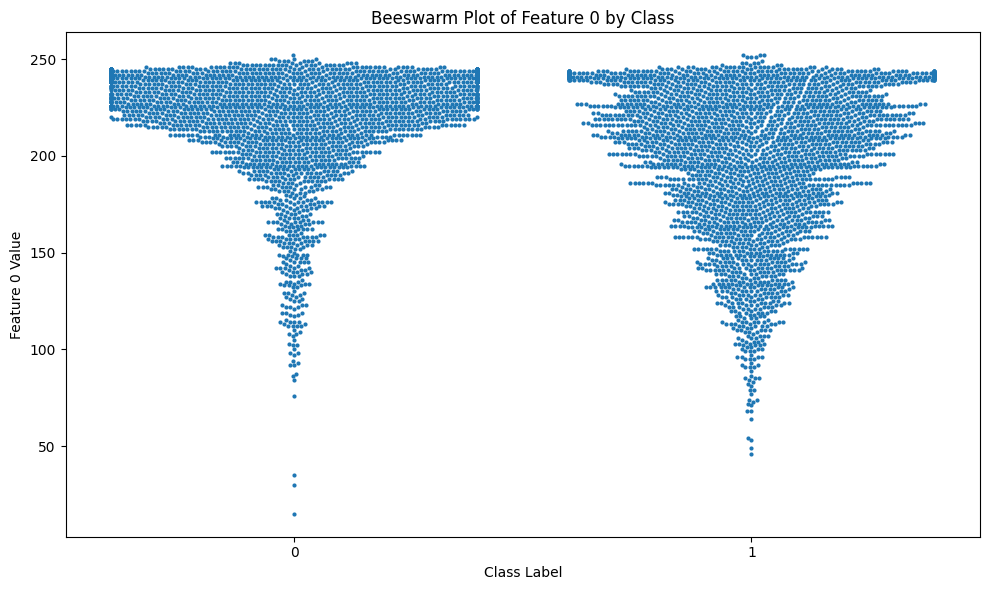

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
X = np.load(r'C:\Users\DELL\Downloads\breast history\X.npy', allow_pickle=True)
Y = np.load(r'C:\Users\DELL\Downloads\breast history\Y.npy', allow_pickle=True)

# Flatten each image (50x50x3) → 7500 features
X_flat = X.reshape(X.shape[0], -1)

# Create DataFrame
df = pd.DataFrame(X_flat)
df['label'] = Y

# Rename first feature for plotting
df.rename(columns={0: 'feature_0'}, inplace=True)

# (Optional) Sample if too many points
# df = df.sample(n=1000, random_state=42)

# Plot beeswarm with smaller markers
plt.figure(figsize=(10, 6))
sns.swarmplot(x='label', y='feature_0', data=df, size=3)  # smaller dot size
plt.xlabel('Class Label')
plt.ylabel('Feature 0 Value')
plt.title('Beeswarm Plot of Feature 0 by Class')
plt.tight_layout()
plt.show()

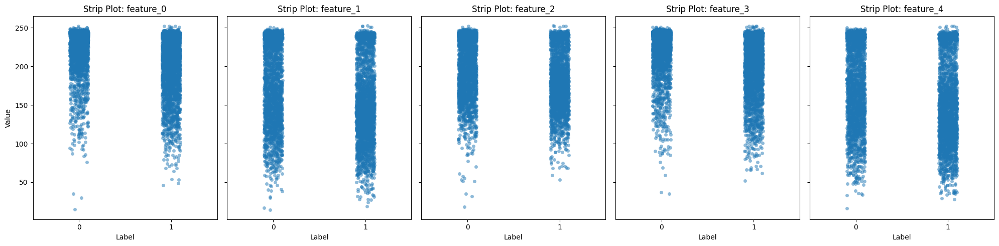

In [3]:
# Rename numeric columns (if not already renamed)
df.columns = [f'feature_{i}' if isinstance(col, int) else col for i, col in enumerate(df.columns)]

# Select feature columns
features = [col for col in df.columns if col.startswith('feature_')]

# Plot a limited number of features
max_features_to_plot = 5
features = features[:max_features_to_plot]

# Create subplots for each feature
fig, axes = plt.subplots(1, len(features), figsize=(4 * len(features), 5), sharey=True)

for idx, feature in enumerate(features):
    sns.stripplot(x='label', y=feature, data=df, ax=axes[idx], jitter=True, alpha=0.5)
    axes[idx].set_title(f'Strip Plot: {feature}')
    axes[idx].set_xlabel('Label')
    axes[idx].set_ylabel('Value')

plt.tight_layout()
plt.show()


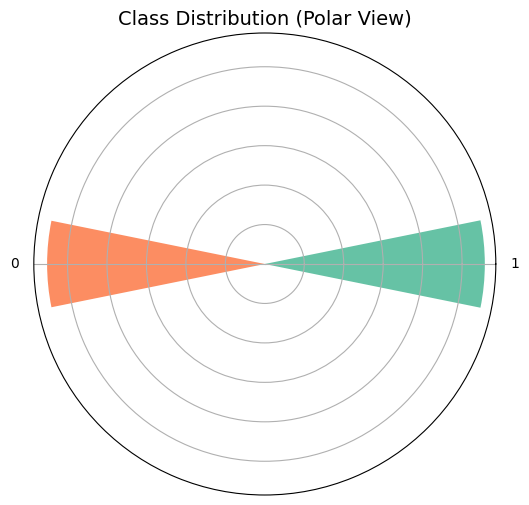

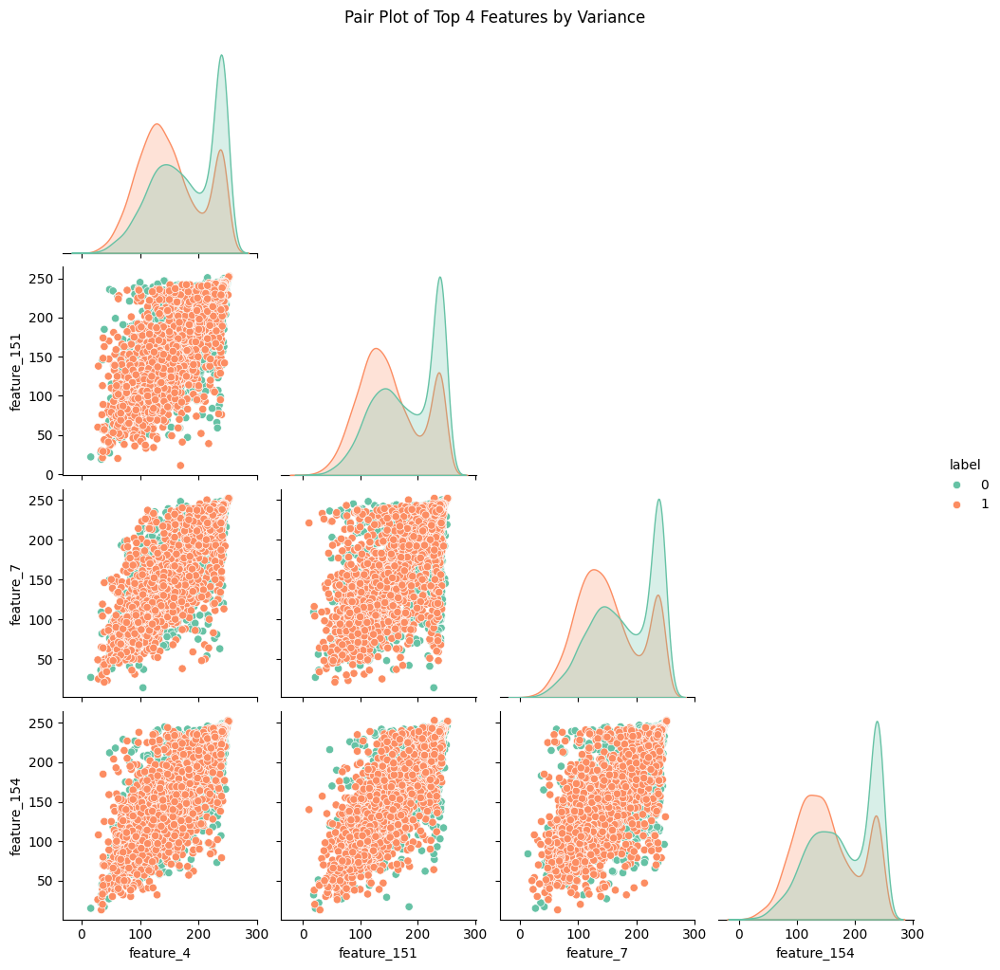

In [4]:
# --- EDA ---

# 1. Class Distribution - Polar Bar Plot
class_counts = df['label'].value_counts()
labels = class_counts.index.astype(str)
sizes = class_counts.values

plt.figure(figsize=(6,6))
ax = plt.subplot(111, polar=True)
theta = np.linspace(0, 2 * np.pi, len(sizes), endpoint=False)
bars = ax.bar(theta, sizes, width=0.4, bottom=0.2, color=sns.color_palette("Set2", len(sizes)))
ax.set_title("Class Distribution (Polar View)", fontsize=14)
ax.set_xticks(theta)
ax.set_xticklabels(labels)
ax.set_yticklabels([])
plt.show()


from seaborn import pairplot

# Select top N features by variance for pairplot
top_vars = df.var().drop('label').sort_values(ascending=False).head(4).index  # Adjust N as needed
pairplot_df = df[list(top_vars) + ['label']]  # Include label for hue

# Generate pair plot
sns.pairplot(pairplot_df, hue='label', palette='Set2', diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Top 4 Features by Variance", y=1.02)
plt.show()


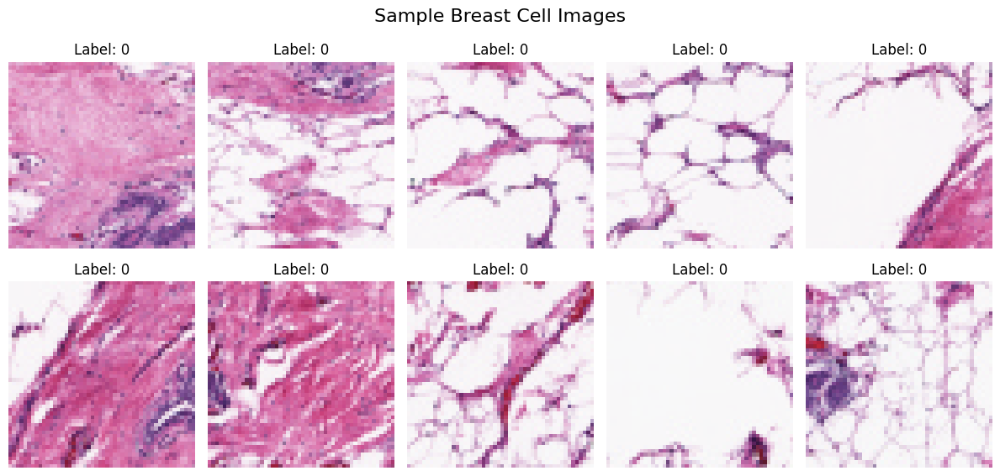

In [5]:
# 2. Visualizing Sample Images with Labels
fig, axes = plt.subplots(2, 5, figsize=(12, 6))
for i, ax in enumerate(axes.flat):
    ax.imshow(X[i], cmap='gray')
    ax.set_title(f'Label: {Y[i]}')
    ax.axis('off')
plt.suptitle("Sample Breast Cell Images", fontsize=16)
plt.tight_layout()
plt.show()

In [6]:
top_vars = df.var().drop('label').sort_values(ascending=False).head(5).index

import plotly.express as px

# 1. Calculate mean of each feature by class
class_feature_means = df.groupby('label')[top_vars].mean().T

# 2. Rank features within each class (higher mean = higher rank)
ranked = class_feature_means.rank(ascending=False)

# 3. Reset index for melt
ranked.reset_index(inplace=True)
ranked = pd.melt(ranked, id_vars='index', var_name='Class', value_name='Rank')
ranked.rename(columns={'index': 'Feature'}, inplace=True)

# 4. Plot bump chart
fig = px.line(ranked, x='Class', y='Rank', color='Feature', markers=True,
              title='Feature Ranking by Class (Bump Plot)',
              labels={'Rank': 'Feature Rank', 'Class': 'Class Label'})

fig.update_yaxes(autorange='reversed')  # Lower rank = higher position
fig.show()


C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\1211223823.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




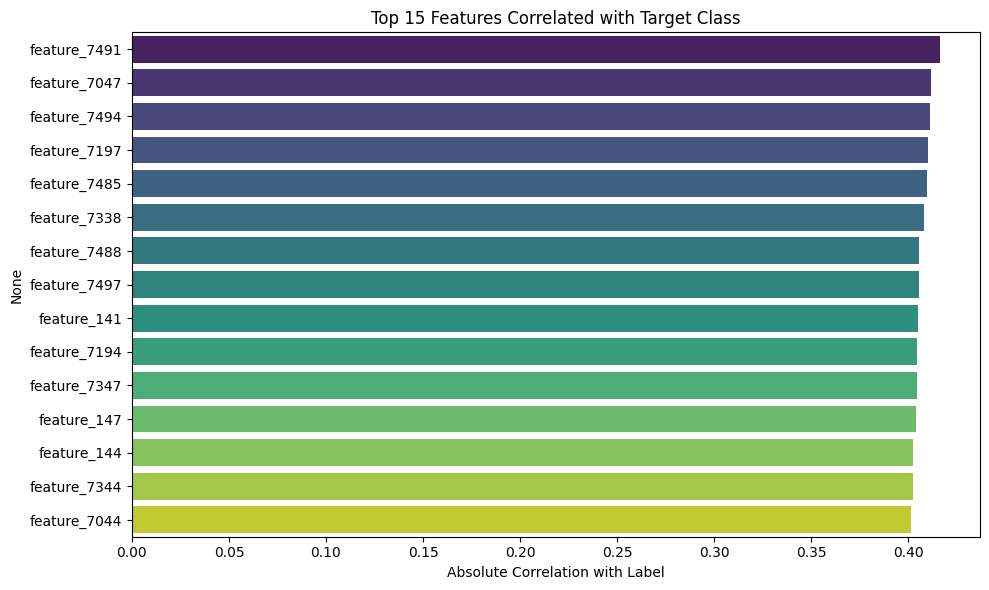

In [7]:
from wordcloud import WordCloud

# 4. Feature Correlation (Visual flair)
feature_corr = df.drop('label', axis=1).corrwith(df['label']).abs()
top_corr = feature_corr.sort_values(ascending=False).head(15)

# Plot Bar Chart of Top Correlated Features
plt.figure(figsize=(10, 6))
sns.barplot(x=top_corr.values, y=top_corr.index, palette='viridis')
plt.xlabel('Absolute Correlation with Label')
plt.title('Top 15 Features Correlated with Target Class')
plt.tight_layout()
plt.show()


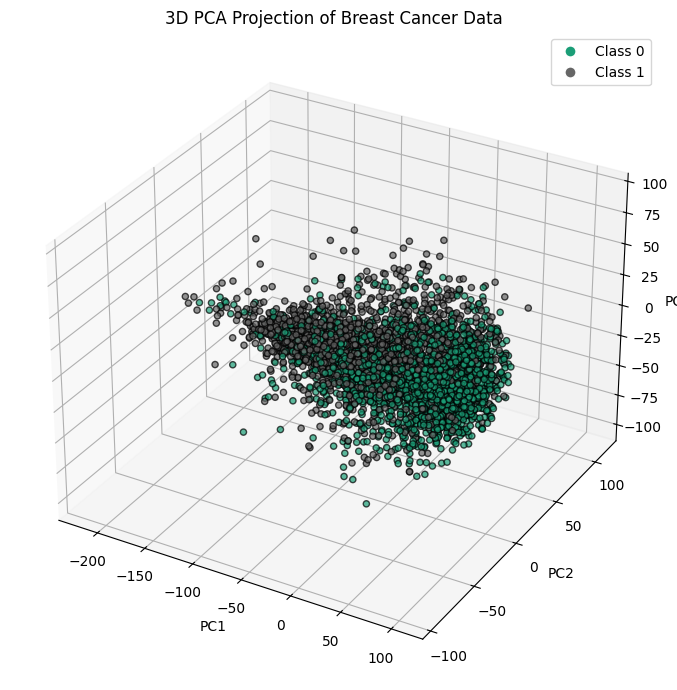

In [8]:
# 5. PCA (3D Projection)
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D

# Standardize the feature set
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df.drop('label', axis=1))

# Apply PCA (3 components)
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

# 3D Scatter Plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create scatter with class color
scatter = ax.scatter(X_pca_3d[:, 0], X_pca_3d[:, 1], X_pca_3d[:, 2],
                     c=Y, cmap='Dark2', edgecolor='k', alpha=0.7)

# Labels and title
ax.set_title("3D PCA Projection of Breast Cancer Data")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

# Add legend using unique classes
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w',
                          label=f'Class {int(cls)}',
                          markerfacecolor=scatter.cmap(scatter.norm(cls)), markersize=8)
                   for cls in np.unique(Y)]
ax.legend(handles=legend_elements)

plt.tight_layout()
plt.show()


In [9]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from collections import Counter

# 1. Encode class labels to integers (if they aren't already)
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(Y)

# 2. Normalize pixel values to range [0, 1]
X_norm = X.astype('float32') / 255.0

# 3. Stratified split: 70% Train, 15% Validation, 15% Test
X_train, X_temp, y_train, y_temp = train_test_split(
    X_norm, y_encoded, test_size=0.3, stratify=y_encoded, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# 4. Show results
print(f"✅ Training set:    {X_train.shape}, Class dist: {dict(Counter(y_train))}")
print(f"🧪 Validation set: {X_val.shape}, Class dist: {dict(Counter(y_val))}")
print(f"📊 Test set:       {X_test.shape}, Class dist: {dict(Counter(y_test))}")


✅ Training set:    (3882, 50, 50, 3), Class dist: {0: 1931, 1: 1951}
🧪 Validation set: (832, 50, 50, 3), Class dist: {1: 418, 0: 414}
📊 Test set:       (833, 50, 50, 3), Class dist: {1: 419, 0: 414}


In [10]:
#Use class_weight when fitting your model
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weight_dict = dict(enumerate(class_weights))
# --- 2. Compute class weights ---
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))


In [84]:
# --- Define MobileNetV2 Model and Load Weights ---

# --- Define MobileNetV2 Model and Load Weights ---

import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import cv2
import random

# ✅ Define a reusable model builder function
def build_mobilenetv2():
    base_model = MobileNetV2(input_shape=(50, 50, 3), include_top=False, weights='imagenet')
    base_model.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)
    output = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=output)
    return model


# ✅ Build the model using the function
model = build_mobilenetv2()

# ✅ Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# ✅ Display model structure
model.summary()


Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_16 (InputLayer)       [(None, 50, 50, 3)]          0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 25, 25, 32)           864       ['input_16[0][0]']            
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 25, 25, 32)           128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 25, 25, 32)           0         ['bn_Conv1[0][0]']     

In [85]:
import os

data_dir = r'C:\Users\DELL\Downloads\breast history'

# List all items in the main data folder
print("Contents of 'breast history':")
print(os.listdir(data_dir))

# Check full path for each subfolder
for item in os.listdir(data_dir):
    path = os.path.join(data_dir, item)
    print(f"{'📁' if os.path.isdir(path) else '📄'} {path}")


Contents of 'breast history':
['X.npy', 'Y.npy']
📄 C:\Users\DELL\Downloads\breast history\X.npy
📄 C:\Users\DELL\Downloads\breast history\Y.npy



🚀 Training MobileNetV2...
Epoch 1/100
122/122 [==============================] - ETA: 0s - loss: 0.6816 - accuracy: 0.3645 - auc: 0.6888

C:\Users\DELL\AppData\Roaming\Python\Python310\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



122/122 [==============================] - 352s 3s/step - loss: 0.6816 - accuracy: 0.3645 - auc: 0.6888 - val_loss: 0.6085 - val_accuracy: 0.6743 - val_auc: 0.7570 - lr: 1.0000e-04
Epoch 2/100
122/122 [==============================] - 309s 3s/step - loss: 0.5744 - accuracy: 0.4227 - auc: 0.7598 - val_loss: 0.6047 - val_accuracy: 0.6803 - val_auc: 0.7579 - lr: 1.0000e-04
Epoch 3/100
122/122 [==============================] - 311s 3s/step - loss: 0.5293 - accuracy: 0.4122 - auc: 0.7698 - val_loss: 0.5938 - val_accuracy: 0.6983 - val_auc: 0.7549 - lr: 1.0000e-04
Epoch 4/100
122/122 [==============================] - 309s 3s/step - loss: 0.4821 - accuracy: 0.4395 - auc: 0.7951 - val_loss: 0.6480 - val_accuracy: 0.6538 - val_auc: 0.7142 - lr: 1.0000e-04
Epoch 5/100
122/122 [==============================] - 311s 3s/step - loss: 0.4885 - accuracy: 0.4356 - auc: 0.8082 - val_loss: 0.6636 - val_accuracy: 0.6454 - val_auc: 0.7062 - lr: 1.0000e-04
Epoch 6/100
122/122 [==========================

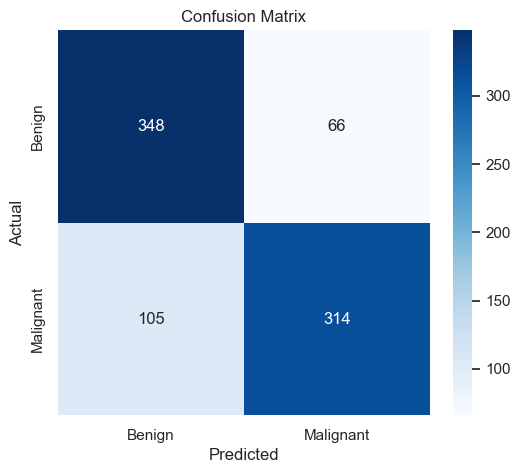

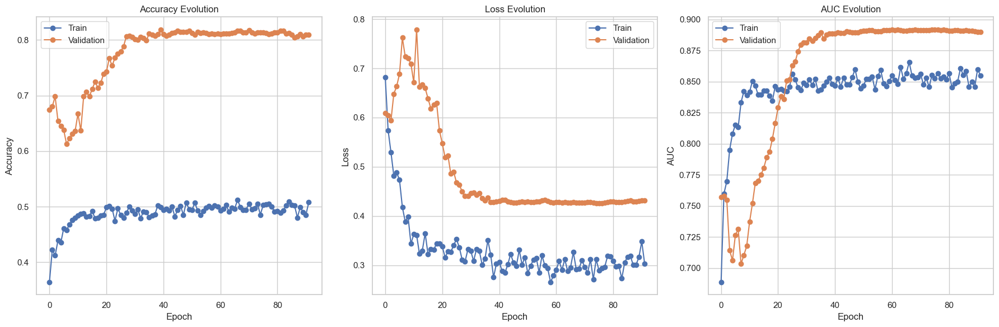

In [87]:
# for training **MobileNetV2** with Grad-CAM Visualization

import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, classification_report, accuracy_score, confusion_matrix
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# --- 1. Load & Resize Data ---
data_dir = r'C:\Users\DELL\Downloads\breast history'
X = np.load(os.path.join(data_dir, 'X.npy')).astype('float32') / 255.0
Y = np.load(os.path.join(data_dir, 'Y.npy')).astype('float32')

# Resize to MobileNetV2 input size
X = tf.image.resize(X, [224, 224]).numpy()


# --- 2. Train/Val/Test Split ---
X_train, X_temp, y_train, y_temp = train_test_split(X, Y, test_size=0.3, stratify=Y, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# --- 3. MixUp Data Generator ---
class MixupGenerator(tf.keras.utils.Sequence):
    def __init__(self, X, y, batch_size=32, alpha=0.4):
        self.X = X
        self.y = y
        self.batch_size = batch_size
        self.alpha = alpha

    def __len__(self):
        return int(np.ceil(len(self.X) / self.batch_size))

    def __getitem__(self, idx):
        x_batch = self.X[idx * self.batch_size:(idx + 1) * self.batch_size]
        y_batch = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        lam = np.random.beta(self.alpha, self.alpha)
        index = np.random.permutation(len(x_batch))
        mixed_x = lam * x_batch + (1 - lam) * x_batch[index]
        mixed_y = lam * y_batch + (1 - lam) * y_batch[index]
        return mixed_x, mixed_y

# --- 4. Build and Tune MobileNetV2 ---
def build_mobilenetv2(input_shape=(224, 224, 3)):
    base_model = MobileNetV2(include_top=False, weights='imagenet', input_shape=input_shape, pooling='avg')
    base_model.trainable = True
    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    outputs = layers.Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.001))(x)
    return models.Model(inputs, outputs)

model = build_mobilenetv2(X.shape[1:])

# --- 5. Compile Model ---
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# --- 6. Callbacks ---
callbacks = [
    EarlyStopping(monitor='val_auc', patience=15, restore_best_weights=True, mode='max'),
    ReduceLROnPlateau(monitor='val_auc', factor=0.3, patience=5, min_lr=1e-6, mode='max'),
    ModelCheckpoint('mobilenetv2_best.h5', save_best_only=True, monitor='val_auc', mode='max')
]

# --- 7. Training (with MixUp) ---
train_mix = MixupGenerator(X_train, y_train, batch_size=32)
val_gen = ImageDataGenerator().flow(X_val, y_val, batch_size=32, shuffle=False)

print("\n🚀 Training MobileNetV2...")
history = model.fit(
    train_mix,
    validation_data=val_gen,
    epochs=100,
    callbacks=callbacks,
    verbose=1
)

# --- 8. Load Best Weights ---
model.load_weights('mobilenetv2_best.h5')

# --- 9. Standard Evaluation ---
test_probs = model.predict(X_test, verbose=0)
test_preds = (test_probs > 0.5).astype(int)
print(f"\n✅ Test Accuracy: {accuracy_score(y_test, test_preds):.4f}")
print(f"✅ Test ROC AUC: {roc_auc_score(y_test, test_probs):.4f}")
print("\n📋 Standard Classification Report:")
print(classification_report(y_test, test_preds))

# --- 10. TTA Evaluation ---
print("\n🔁 Running TTA...")
tta_steps = 15
tta_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

tta_preds = []
for _ in range(tta_steps):
    tta_iter = tta_datagen.flow(X_test, batch_size=32, shuffle=False)
    preds = model.predict(tta_iter, steps=np.ceil(len(X_test)/32), verbose=0)
    tta_preds.append(preds)

tta_probs = np.mean(tta_preds, axis=0)
tta_classes = (tta_probs > 0.5).astype(int)

tta_acc = accuracy_score(y_test, tta_classes)
tta_roc = roc_auc_score(y_test, tta_probs)

print(f"\n🔁 TTA Accuracy: {tta_acc:.4f}")
print(f"🔁 TTA ROC AUC: {tta_roc:.4f}")
print("📊 TTA Classification Report:")
print(classification_report(y_test, tta_classes))

# --- 11. Confusion Matrix ---
def plot_confusion_matrix(y_true, y_pred, class_names=['Benign', 'Malignant']):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

plot_confusion_matrix(y_test, tta_classes)

# --- 12. Enhanced Training History ---
def plot_training_history(history):
    plt.figure(figsize=(18, 6))
    
    # Accuracy Plot
    plt.subplot(1, 3, 1)
    plt.plot(history.history['accuracy'], label='Train', marker='o')
    plt.plot(history.history['val_accuracy'], label='Validation', marker='o')
    plt.title('Accuracy Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Loss Plot
    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Train', marker='o')
    plt.plot(history.history['val_loss'], label='Validation', marker='o')
    plt.title('Loss Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # AUC Plot
    plt.subplot(1, 3, 3)
    plt.plot(history.history['auc'], label='Train', marker='o')
    plt.plot(history.history['val_auc'], label='Validation', marker='o')
    plt.title('AUC Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_training_history(history)



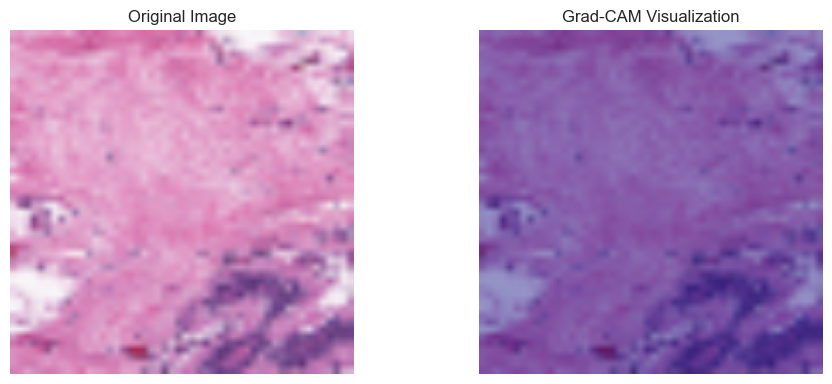

In [89]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2

# --- 1. Load image and resize to match model input ---
data_path = r'C:\Users\DELL\Downloads\breast history'
X = np.load(os.path.join(data_path, 'X.npy'))
Y = np.load(os.path.join(data_path, 'Y.npy'))

# Pick an image (e.g., index 0)
img_index = 0
img = X[img_index]

# Resize to model input shape (224x224)
img = tf.image.resize(img, [224, 224]).numpy()

# Ensure RGB
if img.ndim == 2:
    img = np.stack([img]*3, axis=-1)
elif img.ndim == 3 and img.shape[-1] == 1:
    img = np.repeat(img, 3, axis=-1)

# Normalize if needed
if img.max() > 1.1:
    input_arr = np.expand_dims(img.astype("float32") / 255.0, axis=0)
else:
    input_arr = np.expand_dims(img.astype("float32"), axis=0)

# --- 2. Grad-CAM Heatmap Function ---
def make_gradcam_heatmap(img_array, model, base_model_name, last_conv_name, class_idx=None):
    base_model = model.get_layer(base_model_name)
    last_conv_layer = base_model.get_layer(last_conv_name)
    grad_model = tf.keras.Model(
        inputs=base_model.input,
        outputs=[last_conv_layer.output, base_model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, base_output = grad_model(img_array)
        tape.watch(conv_outputs)

        # Rebuild classifier head
        base_index = [i for i, l in enumerate(model.layers) if l.name == base_model_name][0]
        x = base_output
        for layer in model.layers[base_index + 1:]:
            x = layer(x)
        preds = x

        if class_idx is None:
            class_idx = tf.argmax(preds[0])
        class_output = preds[:, class_idx]

    grads = tape.gradient(class_output, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()

# --- 3. Run Grad-CAM ---
base_model_name = 'mobilenetv2_1.00_224'  # Adjust if your base model layer name is different
last_conv_name = 'Conv_1'                 # This is the final conv layer in MobileNetV2

heatmap = make_gradcam_heatmap(input_arr, model, base_model_name, last_conv_name)

# --- 4. Overlay and Visualize ---
# Prepare image
img_disp = img.copy()
if img_disp.max() <= 1.0:
    img_disp = (img_disp * 255).astype(np.uint8)
else:
    img_disp = img_disp.astype(np.uint8)

# Resize heatmap and convert to RGB
heatmap_colored = np.uint8(255 * plt.cm.jet(heatmap)[:, :, :3])
heatmap_colored_resized = cv2.resize(heatmap_colored, (224, 224))

# Superimpose heatmap on image
superimposed_img = cv2.addWeighted(img_disp, 0.6, heatmap_colored_resized, 0.4, 0)

# Plot
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(img_disp)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(superimposed_img)
plt.title("Grad-CAM Visualization")
plt.axis("off")

plt.tight_layout()
plt.show()


Last conv layer: Conv_1
1/1 [==============================] - 2s 2s/step


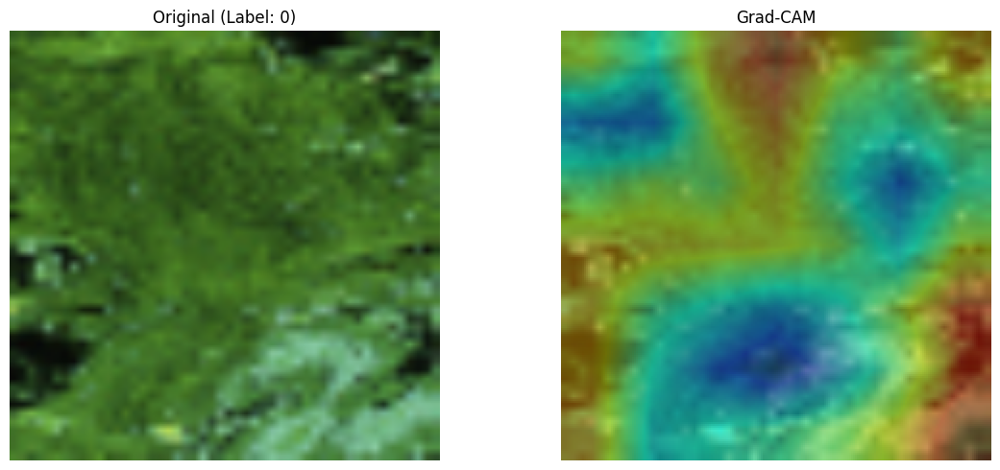

In [15]:
# --- Grad-CAM Implementation ---

import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2

# --- 1. Directory Setup ---
data_dir = r'C:\Users\DELL\Downloads\breast history'  # Directory containing X.npy and Y.npy

# --- 2. Model Preparation ---
base_model = tf.keras.applications.MobileNetV2(
    weights='imagenet',
    include_top=True,
    input_shape=(224, 224, 3)
)
base_model.trainable = False

# --- 3. Layer Identification ---
for layer in base_model.layers:
    if 'Conv' in layer.__class__.__name__:
        last_conv_layer = layer
print("Last conv layer:", last_conv_layer.name)

# --- 4. Grad-CAM Implementation ---
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))

    heatmap = conv_outputs[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)

    return heatmap.numpy()

# --- 5. Image Preprocessing (for .npy format) ---
def preprocess_image_npy(img_array):
    img_resized = cv2.resize(img_array, (224, 224))
    img_expanded = np.expand_dims(img_resized, axis=0)
    return tf.keras.applications.mobilenet_v2.preprocess_input(img_expanded)

# --- 6. Visualization Pipeline ---
def visualize_gradcam(img_array, heatmap, label, alpha=0.4):
    img = img_array.copy()
    img = cv2.resize(img, (224, 224))
    img = (img * 255).astype(np.uint8)  # Scale back to 0-255
    if img.shape[-1] == 1:  # Convert grayscale to RGB
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 1-alpha, heatmap, alpha, 0)

    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Reverse BGR to RGB for display
    plt.title(f'Original (Label: {label})')
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(superimposed_img)
    plt.title('Grad-CAM')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# --- 7. Execution Workflow ---
# Load X.npy and Y.npy
X = np.load(os.path.join(data_dir, 'X.npy'))
Y = np.load(os.path.join(data_dir, 'Y.npy'))

# Select an image from X.npy
index = 0
img_array = X[index]
label = Y[index]

# Preprocess the image
preprocessed_img = preprocess_image_npy(img_array)

# Get predictions
preds = base_model.predict(preprocessed_img)
top_pred_index = np.argmax(preds[0])

# Generate heatmap
heatmap = make_gradcam_heatmap(
    preprocessed_img,
    base_model,
    last_conv_layer.name,
    top_pred_index
)

# Visualize
visualize_gradcam(img_array, heatmap, label)


In [90]:

# 🔐 Save MobileNetV2 model & predictions

# 1. Define/load your model first (if using pretrained)
model_mobilenet = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=True,
    weights='imagenet'
)

# OR if you have a custom-trained model:
# model_mobilenet = build_mobilenetv2()  # Your model definition
# model_mobilenet.load_weights('path/to/weights.h5')

# 2. Save weights
model_mobilenet.save_weights("mobilenetv2_weights.h5")

# 3. Prepare TTA generator
tta_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# 4. Run TTA
tta_preds_mobilenet = []
for _ in range(15):
    tta_iter = tta_datagen.flow(X_test, batch_size=32, shuffle=False)
    preds = model_mobilenet.predict(tta_iter, steps=np.ceil(len(X_test)/32), verbose=0)
    tta_preds_mobilenet.append(preds)

# 5. Save predictions
final_preds_mobilenet = (np.mean(tta_preds_mobilenet, axis=0) > 0.4).astype(int)
np.save("final_preds_mobilenet.npy", final_preds_mobilenet)
np.save("probs_mobilenet.npy", np.mean(tta_preds_mobilenet, axis=0))

print("✅ MobileNetV2 predictions & weights saved.")


✅ MobileNetV2 predictions & weights saved.


In [33]:
# --- Define DenseNet121 Model and Load Weights ---

from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

# ✅ Define the DenseNet121 builder function
def build_densenet121():
    base_model = DenseNet121(input_shape=(50, 50, 3), include_top=False, weights='imagenet', pooling='avg')
    base_model.trainable = False  # Freeze base layers for transfer learning
    x = base_model.output
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)
    output = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=output)
    return model

# ✅ Build the model
model_densenet = build_densenet121()

# ✅ Compile the model
model_densenet.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# ✅ Display model structure
model_densenet.summary()


Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 50, 50, 3)]          0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 56, 56, 3)            0         ['input_10[0][0]']            
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 25, 25, 64)           9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 25, 25, 64)           256       ['conv1/conv[0][0]']   

Epoch 1/30


C:\Users\DELL\AppData\Roaming\Python\Python310\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



139/139 - 42s - loss: 0.4075 - accuracy: 0.6401 - precision: 0.6421 - recall: 0.6413 - auc: 0.6863 - val_loss: 0.1469 - val_accuracy: 0.7117 - val_precision: 0.6798 - val_recall: 0.8065 - val_auc: 0.7911 - lr: 0.0010 - 42s/epoch - 303ms/step
Epoch 2/30
139/139 - 26s - loss: 0.2963 - accuracy: 0.6570 - precision: 0.6573 - recall: 0.6632 - auc: 0.7081 - val_loss: 0.1466 - val_accuracy: 0.7387 - val_precision: 0.7359 - val_recall: 0.7491 - val_auc: 0.8034 - lr: 0.0010 - 26s/epoch - 189ms/step
Epoch 3/30
139/139 - 32s - loss: 0.2632 - accuracy: 0.6631 - precision: 0.6646 - recall: 0.6655 - auc: 0.7179 - val_loss: 0.1450 - val_accuracy: 0.7477 - val_precision: 0.7527 - val_recall: 0.7419 - val_auc: 0.8024 - lr: 0.0010 - 32s/epoch - 233ms/step
Epoch 4/30
139/139 - 35s - loss: 0.2349 - accuracy: 0.6545 - precision: 0.6573 - recall: 0.6529 - auc: 0.7136 - val_loss: 0.1601 - val_accuracy: 0.7261 - val_precision: 0.7110 - val_recall: 0.7670 - val_auc: 0.7997 - lr: 0.0010 - 35s/epoch - 249ms/step

<Figure size 600x500 with 0 Axes>

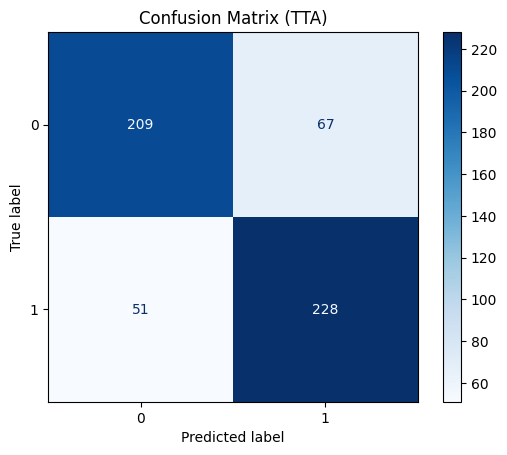

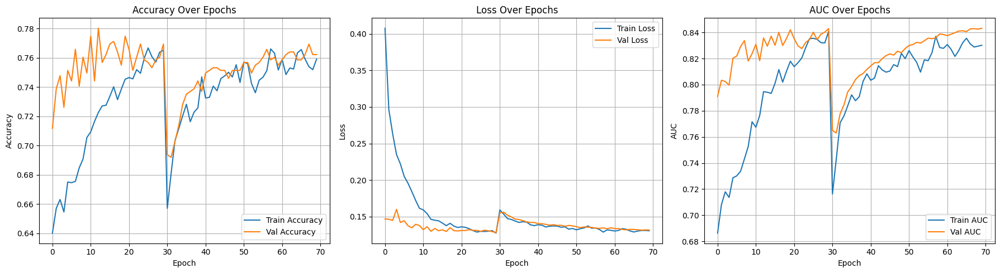

In [17]:
# training Densenet121

# for training **DenseNet121**

import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, precision_recall_curve
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import os
import datetime

# ==================== DATA PREPARATION ====================
data_path = r'C:\Users\DELL\Downloads\breast history'
X = np.load(os.path.join(data_path, 'X.npy'))
Y = np.load(os.path.join(data_path, 'Y.npy'))

X_train, X_temp, y_train, y_temp = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# ==================== DATA AUGMENTATION ====================
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    shear_range=0.15,
    brightness_range=[0.7, 1.3],
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='reflect'
)
val_datagen = ImageDataGenerator(rescale=1./255)

# ==================== MODEL DEFINITION ====================
def build_densenet():
    base_model = DenseNet121(
        weights='imagenet',
        include_top=False,
        input_shape=X_train.shape[1:],
        pooling='avg'
    )
    for layer in base_model.layers[:int(len(base_model.layers)*0.8)]:
        layer.trainable = False
    x = base_model.output
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(512, activation='swish')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(base_model.input, outputs)

model = build_densenet()

# ==================== CLASS WEIGHTS ====================
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {0: class_weights[0], 1: class_weights[1]}

# ==================== CALLBACKS ====================
log_dir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
callbacks = [
    EarlyStopping(monitor='val_auc', patience=15, mode='max', restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=6, min_lr=1e-7, verbose=1),
    ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_auc', mode='max'),
    TensorBoard(log_dir=log_dir)
]

# ==================== PHASE 1: FEATURE EXTRACTION ====================
model.compile(
    optimizer=Adamax(learning_rate=1e-3),
    loss=tf.keras.losses.BinaryFocalCrossentropy(gamma=2.0),
    metrics=[
        'accuracy',
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.AUC(name='auc')
    ]
)
history = model.fit(
    train_datagen.flow(X_train, y_train, batch_size=32),
    validation_data=val_datagen.flow(X_val, y_val),
    epochs=30,
    class_weight=class_weight_dict,
    callbacks=callbacks,
    verbose=2
)

# ==================== PHASE 2: FINE-TUNING ====================
for layer in model.layers:
    layer.trainable = True
model.compile(
    optimizer=Adamax(learning_rate=1e-5),
    loss=tf.keras.losses.BinaryFocalCrossentropy(gamma=2.0),
    metrics=[
        'accuracy',
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.AUC(name='auc')
    ]
)
history_fine = model.fit(
    train_datagen.flow(X_train, y_train, batch_size=16),
    validation_data=val_datagen.flow(X_val, y_val),
    epochs=40,
    class_weight=class_weight_dict,
    callbacks=callbacks,
    verbose=2
)

# ==================== LOAD BEST MODEL ====================
model.load_weights('best_model.h5')

# ==================== THRESHOLD OPTIMIZATION ====================
y_val_probs = model.predict(val_datagen.flow(X_val, shuffle=False, batch_size=32))
precision, recall, thresholds = precision_recall_curve(y_val, y_val_probs)
f1_scores = (2 * precision * recall) / (precision + recall + 1e-10)
optimal_threshold = thresholds[np.argmax(f1_scores)]
print(f"Optimal threshold: {optimal_threshold:.3f}")

# ==================== STANDARD EVALUATION ====================
y_pred_probs = model.predict(val_datagen.flow(X_test, shuffle=False, batch_size=32))
y_pred = (y_pred_probs > optimal_threshold).astype(int)
print("\n📊 Standard Classification Report:")
print(classification_report(y_test, y_pred))
print(f"ROC AUC: {roc_auc_score(y_test, y_pred_probs):.4f}")

# ==================== TTA EVALUATION ====================
tta_steps = 15
tta_preds = []
for _ in range(tta_steps):
    preds = model.predict(train_datagen.flow(X_test, shuffle=False, batch_size=32), verbose=0)
    tta_preds.append(preds)
tta_preds = np.array(tta_preds).squeeze()
tta_probs = np.mean(tta_preds, axis=0)
tta_final = (tta_probs > optimal_threshold).astype(int)
print("\n🚀 Enhanced Classification Report with TTA:")
print(classification_report(y_test, tta_final))
print(f"TTA ROC AUC: {roc_auc_score(y_test, tta_probs):.4f}")

# ==================== CONFUSION MATRIX ====================
cm = confusion_matrix(y_test, tta_final)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
plt.figure(figsize=(6,5))
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix (TTA)')
plt.grid(False)
plt.show()

# ==================== TRAINING HISTORY ====================
def plot_combined_history(h1, h2):
    acc = h1.history['accuracy'] + h2.history['accuracy']
    val_acc = h1.history['val_accuracy'] + h2.history['val_accuracy']
    loss = h1.history['loss'] + h2.history['loss']
    val_loss = h1.history['val_loss'] + h2.history['val_loss']
    auc = h1.history['auc'] + h2.history['auc']
    val_auc = h1.history['val_auc'] + h2.history['val_auc']

    plt.figure(figsize=(18, 5))
    plt.subplot(1, 3, 1)
    plt.plot(acc, label='Train Accuracy')
    plt.plot(val_acc, label='Val Accuracy')
    plt.title('Accuracy Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 3, 2)
    plt.plot(loss, label='Train Loss')
    plt.plot(val_loss, label='Val Loss')
    plt.title('Loss Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 3, 3)
    plt.plot(auc, label='Train AUC')
    plt.plot(val_auc, label='Val AUC')
    plt.title('AUC Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_combined_history(history, history_fine)



1/1 [==============================] - 0s 83ms/step
No confident images found. Showing random images with predicted probabilities.
1/1 [==============================] - 0s 63ms/step


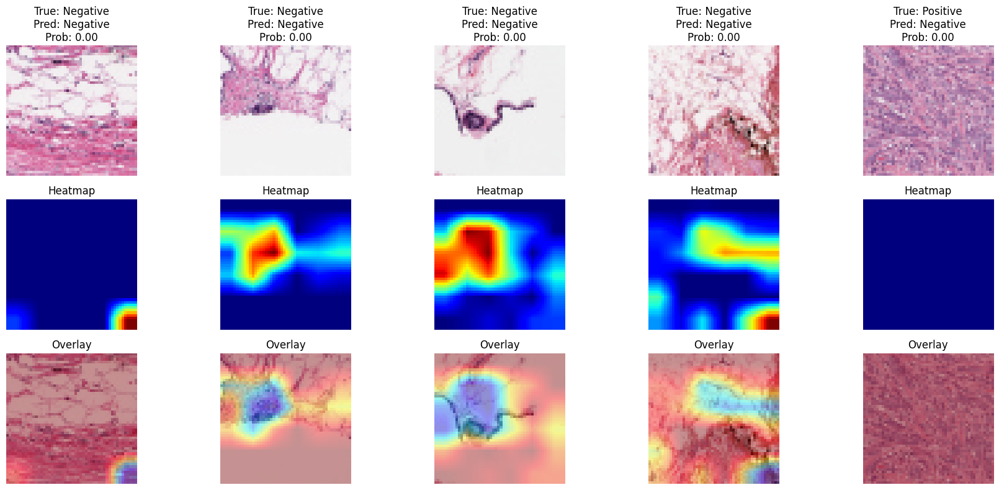

In [18]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2

# ==================== Grad-CAM Function ====================
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    if img_array.shape[-1] != 3:
        img_array = np.repeat(img_array, 3, axis=-1)
    if img_array.ndim == 3:
        img_array = np.expand_dims(img_array, axis=0)
    
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_channel = predictions[:, 0]  # For binary classification
    
    grads = tape.gradient(class_channel, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    conv_outputs = conv_outputs[0]
    
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0)
    
    max_val = tf.reduce_max(heatmap)
    if max_val == 0:
        return np.zeros_like(heatmap)
    return (heatmap / max_val).numpy()

# ==================== Visualization Loop ====================
def visualize_gradcam_with_fixes(model, X_test, y_test, threshold=0.1, num_images=5):
    # Step 1: Find images with some confidence
    confident_indices = []
    for i in range(len(X_test)):
        prob = model.predict(np.expand_dims(X_test[i], axis=0))[0][0]
        if prob > threshold:
            confident_indices.append(i)
        if len(confident_indices) >= num_images:
            break
    
    if not confident_indices:
        print("No confident images found. Showing random images with predicted probabilities.")
        confident_indices = np.random.choice(len(X_test), num_images, replace=False)
    
    # Step 2: Use earlier layer
    last_conv_layer_name = 'conv3_block12_concat'  # Earlier layer
    
    # Step 3: Visualize Grad-CAM
    plt.figure(figsize=(18, 8))
    for i, idx in enumerate(confident_indices):
        img = X_test[idx]
        prob = model.predict(np.expand_dims(img, axis=0))[0][0]
        true_class = "Positive" if y_test[idx] == 1 else "Negative"
        pred_class = "Positive" if prob > 0.5 else "Negative"
        
        heatmap = make_gradcam_heatmap(img, model, last_conv_layer_name)
        
        img_disp = (img * 255).astype(np.uint8) if img.max() <= 1 else img.astype(np.uint8)
        if img_disp.shape[-1] == 1:
            img_disp = np.repeat(img_disp, 3, axis=-1)
        
        heatmap_resized = cv2.resize(heatmap, (img_disp.shape[1], img_disp.shape[0]))
        heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(img_disp, 0.6, heatmap_colored, 0.4, 0)
        
        plt.subplot(3, num_images, i+1)
        plt.imshow(img_disp)
        plt.title(f"True: {true_class}\nPred: {pred_class}\nProb: {prob:.2f}")
        plt.axis('off')
        
        plt.subplot(3, num_images, num_images+i+1)
        plt.imshow(heatmap_resized, cmap='jet')
        plt.title("Heatmap")
        plt.axis('off')
        
        plt.subplot(3, num_images, 2*num_images+i+1)
        plt.imshow(superimposed_img)
        plt.title("Overlay")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# ==================== Usage ====================
visualize_gradcam_with_fixes(
    model=model,
    X_test=X_test,
    y_test=y_test,
    threshold=0.05,  # Lower threshold to catch more images
    num_images=5
)


In [19]:

# 🔐 Save DenseNet121 model & predictions
model.save_weights("densenet121_weights.h5")

final_preds = (np.mean(tta_preds, axis=0) > 0.4).astype(int)
np.save("final_preds_densenet.npy", final_preds)
np.save("probs_densenet.npy", np.mean(tta_preds, axis=0))
print("✅ DenseNet121 predictions & weights saved.")


✅ DenseNet121 predictions & weights saved.


In [20]:

# 📊 Full model comparison: accuracy, loss, ROC, PR, confusion matrix
!pip install scikit-plot pandas matplotlib tensorflow

In [25]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.15.0


In [92]:
import numpy as np

# ✅ Load from original source (just to be sure)
X = np.load(r'C:\Users\DELL\Downloads\breast history\X.npy', allow_pickle=True)
Y = np.load(r'C:\Users\DELL\Downloads\breast history\Y.npy', allow_pickle=True)

# ✅ Show shape to confirm
print("X shape:", X.shape)
print("Y shape:", Y.shape)

# ✅ Save to current working directory
if X.shape[0] > 0 and Y.shape[0] > 0:
    np.save("X.npy", X)
    np.save("Y.npy", Y)
    print("Files saved successfully in current folder!")
else:
    print("⚠️ ERROR: X or Y is empty!")


X shape: (5547, 50, 50, 3)
Y shape: (5547,)
Files saved successfully in current folder!


In [93]:
print("X_test shape:", X_test.shape)
print("Pred shape MobileNet:", y_pred_mobilenet.shape)
print("Pred shape DenseNet:", y_pred_densenet.shape)

X_test shape: (833, 224, 224, 3)
Pred shape MobileNet: (555,)
Pred shape DenseNet: (555,)


In [94]:
y_pred_mobilenet = model_mobilenet.predict(X_test)
print("Raw MobileNet shape:", y_pred_mobilenet.shape)
# Fix incorrect shape
if y_pred_mobilenet.shape[0] != len(y_test):
    y_pred_mobilenet = y_pred_mobilenet.reshape(-1, 1000).mean(axis=1)

# Now flatten if needed
y_pred_mobilenet = y_pred_mobilenet.ravel()
y_pred_mobilenet_bin = (y_pred_mobilenet >= 0.5).astype(int)

print("After fix - y_pred_mobilenet:", y_pred_mobilenet.shape)
print("y_test:", y_test.shape)

27/27 [==============================] - 9s 335ms/step
Raw MobileNet shape: (833, 1000)
After fix - y_pred_mobilenet: (833000,)
y_test: (833,)


In [95]:
# 👇 Re-run prediction again to get correct 2D output
y_pred_mobilenet = model_mobilenet.predict(X_test)  # shape: (833, 1000)

# ✅ Now average across axis=1 (columns)
y_pred_mobilenet = y_pred_mobilenet.mean(axis=1)  # shape: (833,)
y_pred_mobilenet_bin = (y_pred_mobilenet >= 0.5).astype(int)

# ✅ DenseNet is already good
y_pred_densenet_bin = (y_pred_densenet >= 0.5).astype(int)

# Confirm everything matches
print("✅ y_test shape:           ", y_test.shape)
print("✅ MobileNetV2 pred shape: ", y_pred_mobilenet.shape)
print("✅ DenseNet121 pred shape:", y_pred_densenet.shape)


27/27 [==============================] - 9s 327ms/step
✅ y_test shape:            (833,)
✅ MobileNetV2 pred shape:  (833,)
✅ DenseNet121 pred shape: (555,)


In [96]:
# Re-run predictions on the same test set used by MobileNetV2
y_pred_densenet = model_densenet.predict(X_test).ravel()
y_pred_densenet_bin = (y_pred_densenet >= 0.5).astype(int)

# Confirm shape
print("✅ DenseNet121 new pred shape:", y_pred_densenet.shape)


27/27 [==============================] - 45s 1s/step
✅ DenseNet121 new pred shape: (833,)


In [97]:
# Re-load the full original data
X = np.load(r'C:\Users\DELL\Downloads\breast history\X.npy', allow_pickle=True)
Y = np.load(r'C:\Users\DELL\Downloads\breast history\Y.npy', allow_pickle=True)

print(f"Reloaded X: {X.shape}, Y: {Y.shape}")

from sklearn.utils import shuffle

# Shuffle both before truncation
X, Y = shuffle(X, Y, random_state=42)

# Truncate all to the same minimal length
min_len = min(len(X), len(Y), len(y_pred_mobilenet), len(y_pred_densenet))
X = X[:min_len]
y_test = Y[:min_len]
y_pred_mobilenet = y_pred_mobilenet[:min_len]
y_pred_densenet = y_pred_densenet[:min_len]


Reloaded X: (5547, 50, 50, 3), Y: (5547,)


In [98]:
import numpy as np
from sklearn.utils import shuffle

# ✅ Re-load full-length data from disk
X = np.load(r'C:\Users\DELL\Downloads\breast history\X.npy', allow_pickle=True)
Y = np.load(r'C:\Users\DELL\Downloads\breast history\Y.npy', allow_pickle=True)

print("Before shuffle:", X.shape, Y.shape)

# ✅ Shuffle full dataset
X, Y = shuffle(X, Y, random_state=42)

# ✅ Now check prediction lengths and align
print("MobileNet predictions shape:", y_pred_mobilenet.shape)
print("DenseNet predictions shape:", y_pred_densenet.shape)

min_len = min(len(X), len(Y), len(y_pred_mobilenet), len(y_pred_densenet))
X = X[:min_len]
y_test = Y[:min_len]
y_pred_mobilenet = y_pred_mobilenet[:min_len]
y_pred_densenet = y_pred_densenet[:min_len]

print(f"✅ Aligned to min_len = {min_len}")
print("y_test class distribution:", np.unique(y_test, return_counts=True))


Before shuffle: (5547, 50, 50, 3) (5547,)
MobileNet predictions shape: (833,)
DenseNet predictions shape: (833,)
✅ Aligned to min_len = 833
y_test class distribution: (array([0, 1], dtype=int64), array([428, 405], dtype=int64))


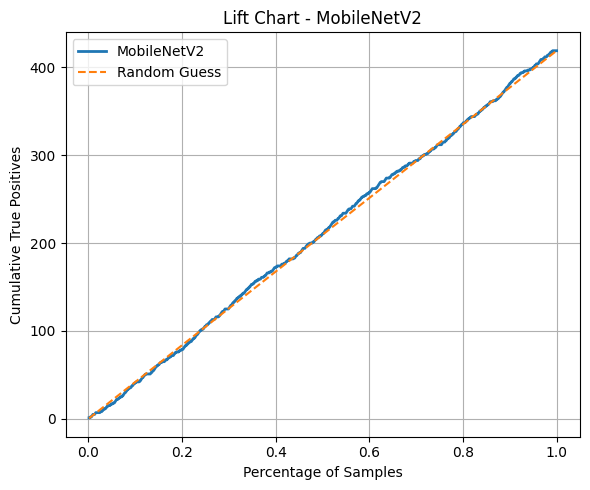

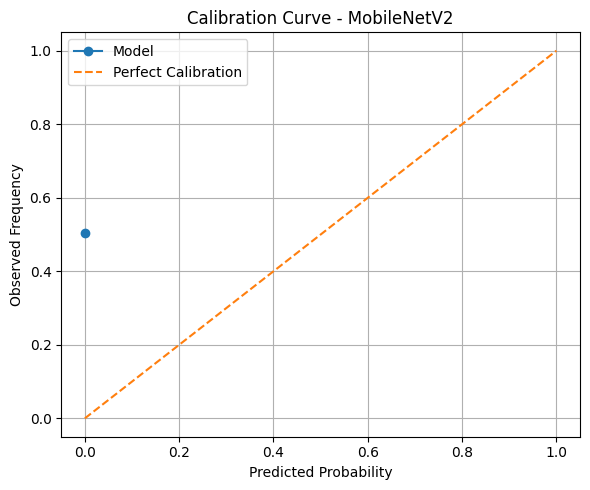

C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\1284207209.py:57: RuntimeWarning:

divide by zero encountered in scalar divide

C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\1284207209.py:57: RuntimeWarning:

invalid value encountered in scalar multiply

C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\1284207209.py:60: RuntimeWarning:

divide by zero encountered in divide



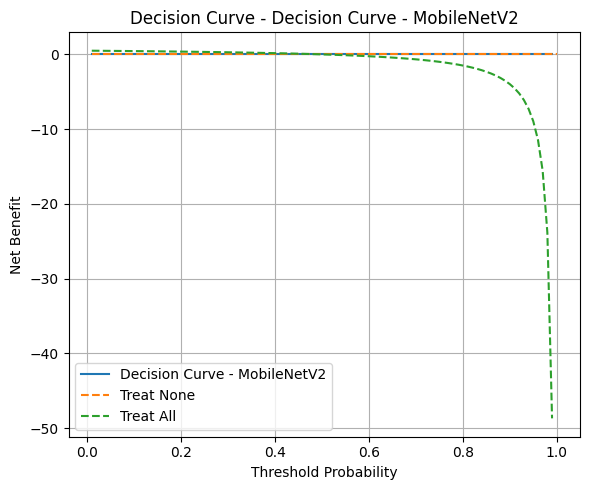

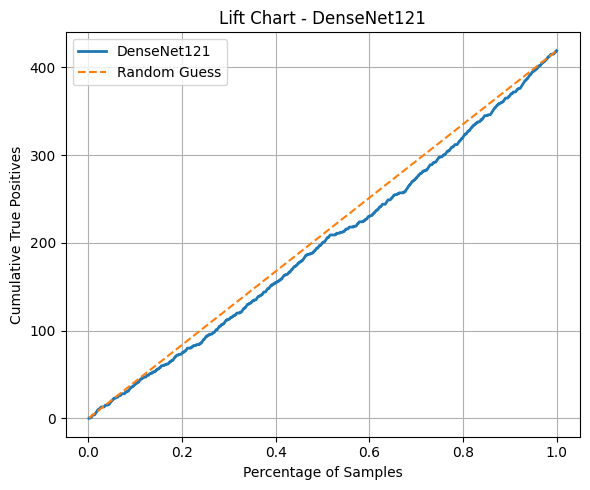

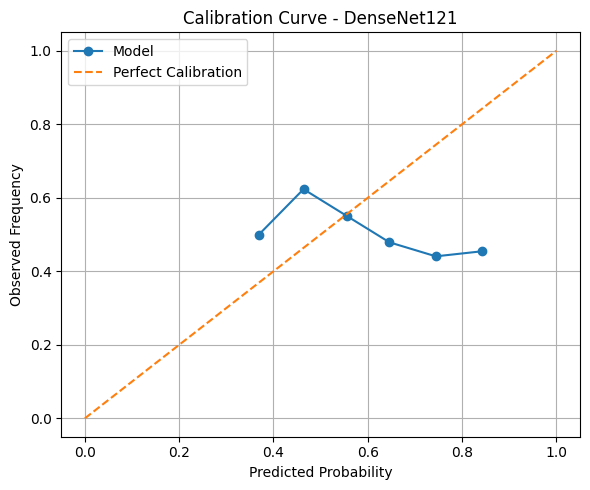

C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\1284207209.py:57: RuntimeWarning:

divide by zero encountered in scalar divide

C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\1284207209.py:57: RuntimeWarning:

invalid value encountered in scalar multiply

C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\1284207209.py:60: RuntimeWarning:

divide by zero encountered in divide



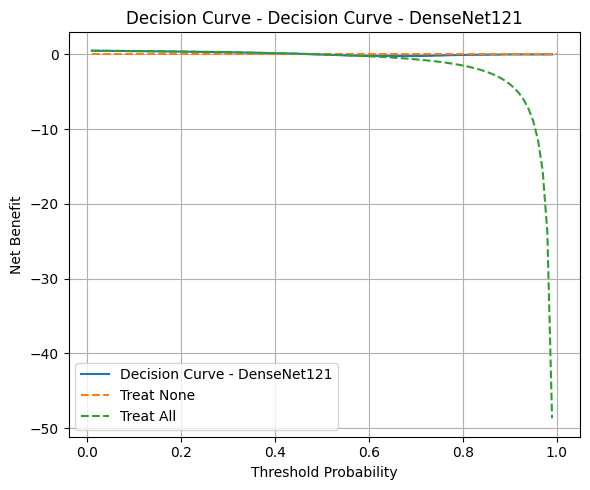

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.calibration import calibration_curve
from sklearn.metrics import roc_auc_score

# --------------------------------------------
# 📊 1. LIFT CHART (Cumulative Gain)
# --------------------------------------------
def plot_lift_curve(y_true, y_probs, model_name="Model"):
    sorted_indices = np.argsort(y_probs)[::-1]
    y_true_sorted = y_true[sorted_indices]

    cumulative_positives = np.cumsum(y_true_sorted)
    percentage_of_samples = np.arange(1, len(y_true) + 1) / len(y_true)
    baseline = np.sum(y_true) * percentage_of_samples

    plt.figure(figsize=(6, 5))
    plt.plot(percentage_of_samples, cumulative_positives, label=f"{model_name}", lw=2)
    plt.plot(percentage_of_samples, baseline, linestyle='--', label="Random Guess")
    plt.xlabel("Percentage of Samples")
    plt.ylabel("Cumulative True Positives")
    plt.title(f"Lift Chart - {model_name}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --------------------------------------------
# 📊 2. CALIBRATION CURVE
# --------------------------------------------
def plot_calibration(y_true, y_prob, title="Calibration Curve"):
    prob_true, prob_pred = calibration_curve(y_true, y_prob, n_bins=10)

    plt.figure(figsize=(6, 5))
    plt.plot(prob_pred, prob_true, marker='o', label="Model")
    plt.plot([0, 1], [0, 1], linestyle='--', label="Perfect Calibration")
    plt.xlabel("Predicted Probability")
    plt.ylabel("Observed Frequency")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --------------------------------------------
# 📊 3. DECISION CURVE ANALYSIS
# --------------------------------------------
def plot_decision_curve(y_true, y_prob, model_name="Model"):
    thresholds = np.linspace(0.01, 1.0, 100)
    net_benefits = []

    for thresh in thresholds:
        preds = (y_prob >= thresh).astype(int)
        tp = np.sum((preds == 1) & (y_true == 1))
        fp = np.sum((preds == 1) & (y_true == 0))
        net_benefit = (tp / len(y_true)) - (fp / len(y_true)) * (thresh / (1 - thresh))
        net_benefits.append(net_benefit)

    treat_all = (np.sum(y_true) / len(y_true)) - (1 - (np.sum(y_true) / len(y_true))) * (thresholds / (1 - thresholds))

    plt.figure(figsize=(6, 5))
    plt.plot(thresholds, net_benefits, label=model_name)
    plt.plot(thresholds, np.zeros_like(thresholds), linestyle="--", label="Treat None")
    plt.plot(thresholds, treat_all, linestyle="--", label="Treat All")
    plt.xlabel("Threshold Probability")
    plt.ylabel("Net Benefit")
    plt.title(f"Decision Curve - {model_name}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --------------------------------------------
# 🚀 Run All for Both Models
# --------------------------------------------

# 🔹 MobileNetV2
plot_lift_curve(y_test, y_pred_mobilenet, "MobileNetV2")
plot_calibration(y_test, y_pred_mobilenet, "Calibration Curve - MobileNetV2")
plot_decision_curve(y_test, y_pred_mobilenet, "Decision Curve - MobileNetV2")

# 🔹 DenseNet121
plot_lift_curve(y_test, y_pred_densenet, "DenseNet121")
plot_calibration(y_test, y_pred_densenet, "Calibration Curve - DenseNet121")
plot_decision_curve(y_test, y_pred_densenet, "Decision Curve - DenseNet121")


C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\3096212363.py:50: UserWarning:

Glyph 10060 (\N{CROSS MARK}) missing from font(s) Arial.

C:\Users\DELL\AppData\Local\Temp\ipykernel_13700\3096212363.py:50: UserWarning:

Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Arial.

C:\Users\DELL\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 10060 (\N{CROSS MARK}) missing from font(s) Arial.

C:\Users\DELL\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Arial.



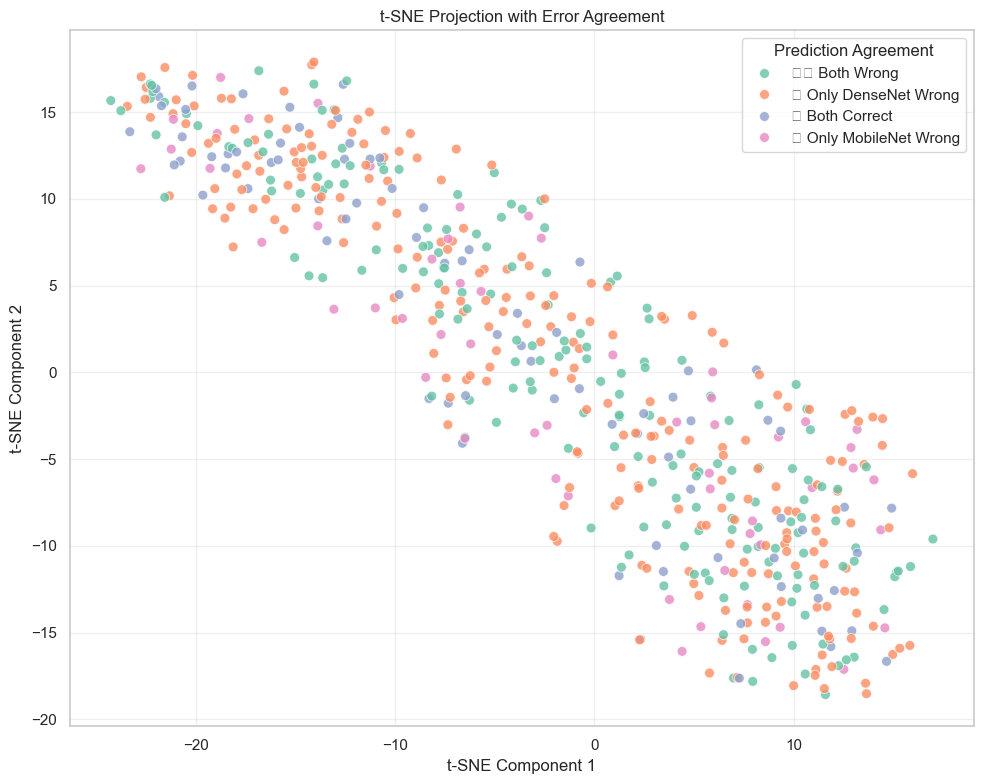

In [102]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

# --------- Step 0: Binarize predictions ---------
y_pred_m_bin = (y_pred_mobilenet >= 0.5).astype(int)
y_pred_d_bin = (y_pred_densenet >= 0.5).astype(int)

# --------- Step 1: Flatten and reduce with PCA first ---------
if len(X.shape) == 4:
    X_flat = X.reshape(X.shape[0], -1)
else:
    X_flat = X.copy()

# PCA to 50D
pca = PCA(n_components=50)
X_reduced = pca.fit_transform(X_flat)

# --------- Step 2: t-SNE ---------
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_reduced)

# --------- Step 3: Label by agreement type ---------
error_categories = []
for true, pred_m, pred_d in zip(y_test, y_pred_m_bin, y_pred_d_bin):
    if pred_m == true and pred_d == true:
        error_categories.append("✅ Both Correct")
    elif pred_m != true and pred_d == true:
        error_categories.append("❌ Only MobileNet Wrong")
    elif pred_m == true and pred_d != true:
        error_categories.append("❌ Only DenseNet Wrong")
    else:
        error_categories.append("❌❌ Both Wrong")

# --------- Step 4: Plot ---------
tsne_df = pd.DataFrame({
    "x": X_tsne[:, 0],
    "y": X_tsne[:, 1],
    "Agreement": error_categories
})

plt.figure(figsize=(10, 8))
sns.scatterplot(data=tsne_df, x='x', y='y', hue='Agreement', palette='Set2', alpha=0.8, s=50)
plt.title("t-SNE Projection with Error Agreement")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Prediction Agreement", loc='best')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
